# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Camera Calibration
### First, I'll compute the camera calibration using chessboard images

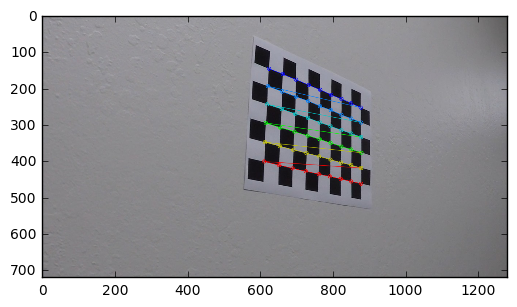

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import random
%matplotlib inline  

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x, y coordinates

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
mtx = None
dist = None

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = plt.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)

### Next I'll test the calibration parameters by undistorting a calibration image

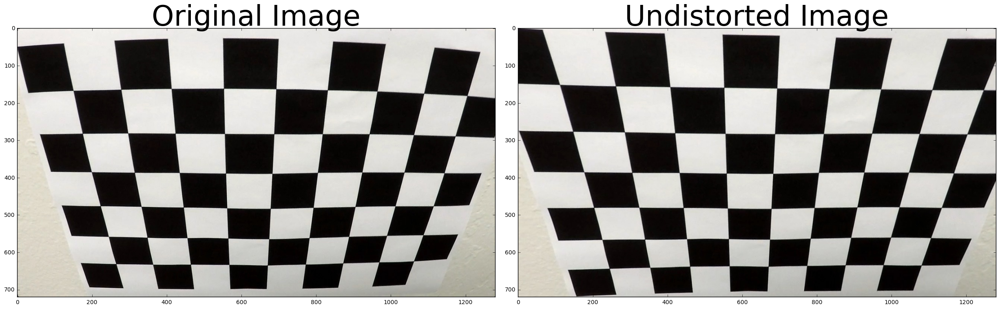

In [2]:
# Return the undistorted image
def calibrate(img, objpoints, imgpoints):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Find corners of the chessboard
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # Calibrate camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    return mtx, dist
    
def calc_undistort(img, mtx, dist):
    # Undistort
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# Read in an image and test undistortion
img = plt.imread('./camera_cal/calibration2.jpg')
mtx, dist = calibrate(img, objpoints, imgpoints)
undistorted = calc_undistort(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/distortion.png', bbox_inches="tight")

### Now I'll unwarp one of the calibration images

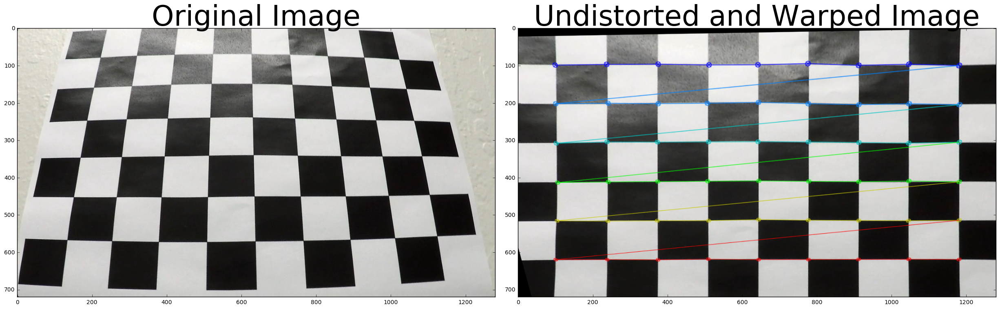

In [4]:
def unwarp(img, nx, ny, objpoints, imgpoints, offset):
    # Undistort the image
    undist = calc_undistort(img, mtx, dist)
    
    # Convert to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    
    # Search for corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        # Draw corners
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        img_size = (gray.shape[1], gray.shape[0])
        
        # Get the outer four corners detected for source points
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        
        # Use offset to choose four corners for destination points
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset],
                         [img_size[0]-offset, img_size[1]-offset],
                         [offset, img_size[1]-offset]])
        
        # Calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        
        # Warp the image
        warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    else:
        # If no corners were found, return None
        warped, M = None
    return warped, M

# Test on calibration image
img = plt.imread('./camera_cal/calibration3.jpg')
top_down, perspective_M = unwarp(img, 9, 6, objpoints, imgpoints, 100)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/warped.png', bbox_inches="tight")

## Lane-Finding Pipeline
### First I'll write a helper function for printing and saving images

In [5]:
def plot_imgs(imgs, titles, figsize=(24, 9), cmap='gray', save=False):
    # Number of images
    num_imgs = len(imgs)
    
    # Create figure
    f, axes = plt.subplots(1, num_imgs, figsize=figsize)
    f.tight_layout()
    for i in range(num_imgs):
        axes[i].imshow(imgs[i], cmap=cmap)
        axes[i].set_title(titles[i], fontsize=50)
    
    # Save figure
    if save == True:
        plt.savefig('./output_images/' + titles[-1] + '.png', bbox_inches='tight')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Now I will undistort each of the test images

In [7]:
# Make a list of test images
image_paths = glob.glob('./test_images/*.jpg')
original_imgs = []
undistorted_imgs = []

# Step through the list and undistort each image
for fname in image_paths:
    img = plt.imread(fname)
    original_imgs.append(img)
    undist = calc_undistort(img, mtx, dist)
    undistorted_imgs.append(undist)

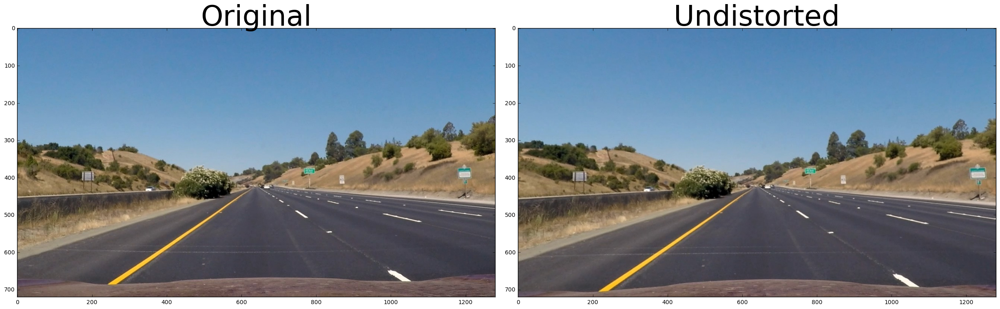

In [8]:
# Visualize one of the undistorted test images
plot_imgs((original_imgs[0], undistorted_imgs[0]), ('Original', 'Undistorted'), cmap=None, save=True)

### I'll also use this image to compute the perspective transform for all test images

In [9]:
# Define source and destination points
src = np.float32([[600, 448], [686, 448], [1120, 720], [202, 720]])
dst = np.float32([[350, 0], [900, 0], [900, 720], [350, 720]])
    
def warp(img, src, dst, reverse=False):
    img_size = (img.shape[1], img.shape[0])
    
    # Compute perspective transform and inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Allow for transforming from warped image, back to original
    if reverse == True:
        warped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
        return warped
    else:
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
        return warped

warped_imgs = []    

for img in undistorted_imgs:
    warped = warp(img, src, dst)
    warped_imgs.append(warped)

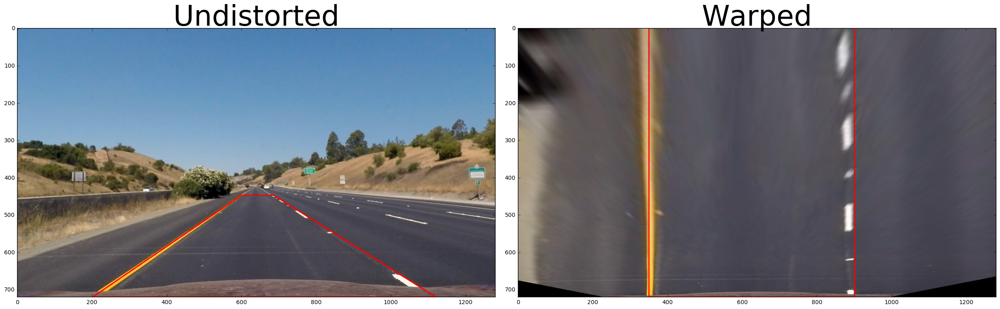

In [10]:
# Draw lines around warped area
image = np.copy(undistorted_imgs[0])
warped_image = warped_imgs[0]

cv2.line(image, (src[0,0], src[0,1]), (src[1,0], src[1,1]), [255, 0, 0], 2)
cv2.line(image, (src[1,0], src[1,1]), (src[2,0], src[2,1]), [255, 0, 0], 2)
cv2.line(image, (src[2,0], src[2,1]), (src[3,0], src[3,1]), [255, 0, 0], 2)
cv2.line(image, (src[3,0], src[3,1]), (src[0,0], src[0,1]), [255, 0, 0], 2)

cv2.line(warped_image, (dst[0,0], dst[0,1]), (dst[1,0], dst[1,1]), [255, 0, 0], 2)
cv2.line(warped_image, (dst[1,0], dst[1,1]), (dst[2,0], dst[2,1]), [255, 0, 0], 2)
cv2.line(warped_image, (dst[2,0], dst[2,1]), (dst[3,0], dst[3,1]), [255, 0, 0], 2)
cv2.line(warped_image, (dst[3,0], dst[3,1]), (dst[0,0], dst[0,1]), [255, 0, 0], 2)

# Visualize warped image
plot_imgs((image, warped_image), ('Undistorted', 'Warped'), save=True)

### Next, I'll combine different thresholds to get a binary image

In [11]:
# Gradient threshold
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0) if orient == 'x' else cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    absolute = np.absolute(sobel)
    scaled = np.uint8(255*absolute/np.max(absolute))
    grad_binary = np.zeros_like(scaled)
    grad_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
    return grad_binary

# Magnitude of the gradient
def mag_threshold(img, sobel_kernel=3, thresh=(0, 255)):
    # Calculate gradient magnitude
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    scaled = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    mag_binary = np.zeros_like(scaled)
    mag_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
    return mag_binary

# Direction of the gradient
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.sqrt(sobelx**2)
    abs_sobely = np.sqrt(sobely**2)
    grad = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(grad)
    dir_binary[(grad >= thresh[0]) & (grad <= thresh[1])] = 1
    return dir_binary

### Now I'll visualize some thresholded images and test out different combinations

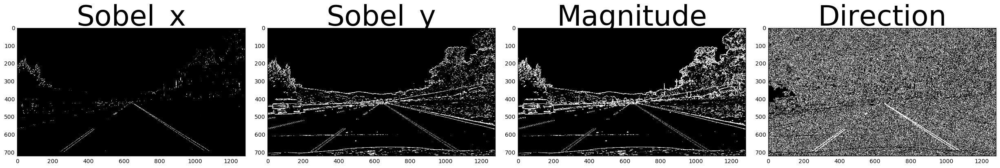

In [12]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Choose an image to test on
image = undistorted_imgs[1]

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(50, 100))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_threshold(image, sobel_kernel=ksize, thresh=(20, 100))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

plot_imgs((gradx, grady, mag_binary, dir_binary), 
          ('Sobel_x', 'Sobel_y', 'Magnitude', 'Direction', 'Thresholds'), 
          save=True)

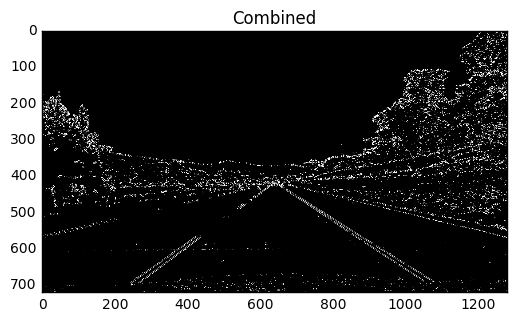

In [13]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

plt.imshow(combined, cmap='gray')
plt.title('Combined')

### The next step will be to apply color thresholding as well
I'll start with applying a threshold over each channel in RGB and HLS colorspace and compare

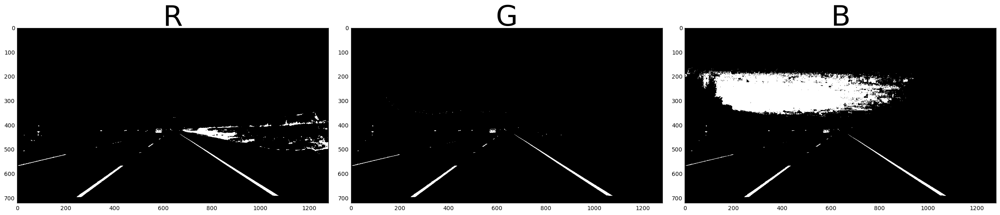

In [14]:
image = undistorted_imgs[1]
R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

binary_R = np.zeros_like(R)
binary_R[(R > 200) & (R <= 255)] = 1

binary_G = np.zeros_like(G)
binary_G[(G > 200) & (G <= 255)] = 1

binary_B = np.zeros_like(B)
binary_B[(B > 200) & (B <= 255)] = 1

plot_imgs((binary_R, binary_G, binary_B), 
          ('R', 'G', 'B'))

The red channel is best at capturing the yellow line and it doesn't capture any of the blue from the sky.

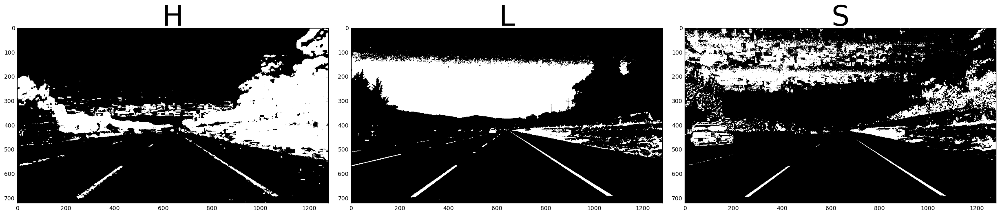

In [15]:
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

binary_H = np.zeros_like(H)
binary_H[(H > 15) & (H <= 100)] = 1

binary_L = np.zeros_like(L)
binary_L[(L > 150) & (L <= 255)] = 1

binary_S = np.zeros_like(S)
binary_S[(S > 100) & (S <= 255)] = 1

plot_imgs((binary_H, binary_L, binary_S), ('H', 'L', 'S'))

The saturation channel captures both lane lines, although the lightness channel captures the white lines more clearly in some cases.

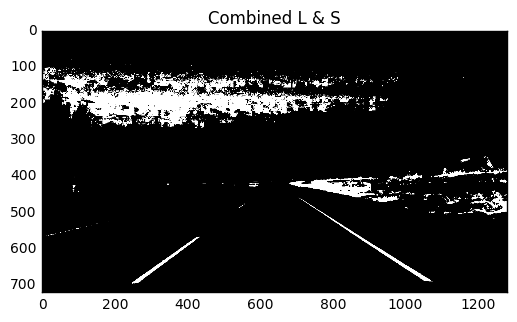

In [16]:
combined = np.zeros_like(binary_S)
combined[((binary_S == 1) & (binary_L == 1))] = 1

plt.imshow(combined, cmap='gray')
plt.title('Combined L & S')

### Because the S channel seems to distinguish the lane lines from the road the best, I will write a function to threshold the S channel

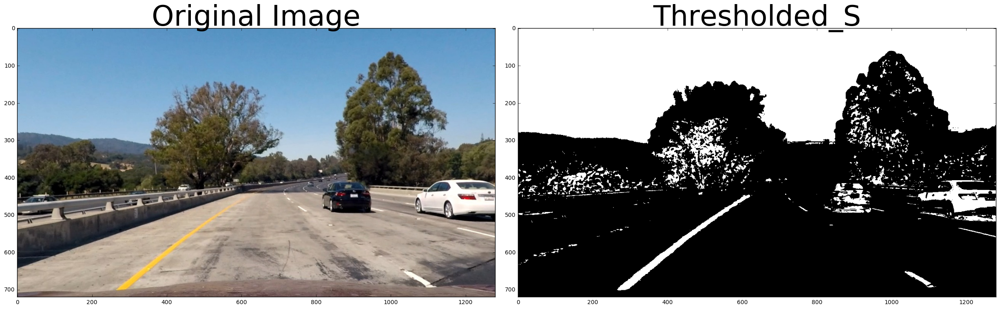

In [17]:
# Function to threshold the S channel
def S_select(img, thresh=(0, 255)):
    # Convert to HLS and separate S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary_output

image = undistorted_imgs[2]
binary_S = S_select(image, thresh=(100, 255))

plot_imgs((image, binary_S), ('Original Image', 'Thresholded_S'), save=True)

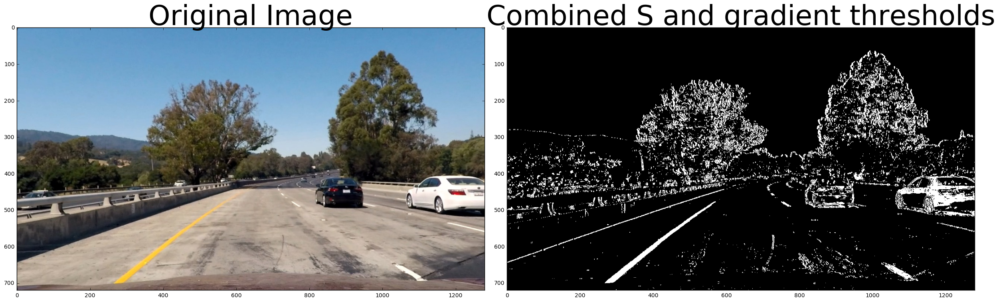

In [18]:
def threshold_pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    # Convert to HLS color space and exclude the H channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.uint8)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold S channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Combine thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

S_gradient = threshold_pipeline(image)

plot_imgs((image, S_gradient), ('Original Image', 'Combined S and gradient thresholds', 'combined_thresholds'), save=True)

### Now I'll apply perspective transform on some thresholded images

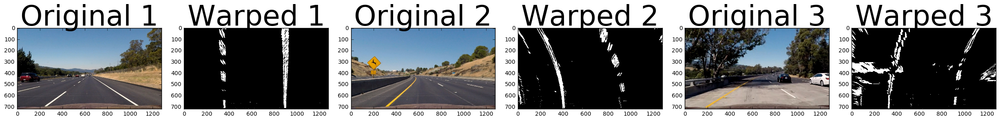

In [19]:
images = []
images.append(undistorted_imgs[1])
images.append(undistorted_imgs[3])
images.append(undistorted_imgs[6])

transformed_imgs = []
for img in images:
    img = threshold_pipeline(img)
    img = warp(img, src, dst)
    transformed_imgs.append(img)

plot_imgs((images[0], transformed_imgs[0], 
           images[1], transformed_imgs[1], 
           images[2], transformed_imgs[2]),
          ('Original 1', 'Warped 1',
          'Original 2', 'Warped 2',
          'Original 3', 'Warped 3', 'Thresholded_and_Warped'), save=True)

### Next, I will locate the lines in the warped and thresholded images

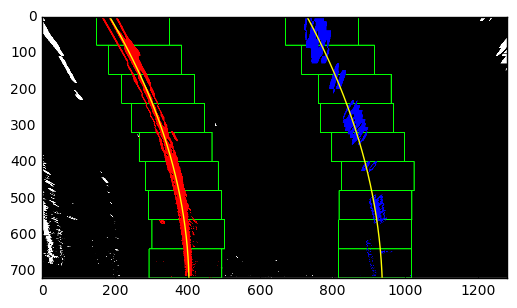

In [20]:
# Find lanes using peaks in a histogram
# input is a warped/thresholded image
def find_lane_lines(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[250:midpoint-100]) + 250
    rightx_base = np.argmax(histogram[midpoint+100:1000]) + midpoint+100
    
    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    
    # Set the width of the windows +/- margin
    margin = 100

    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Color lane lines red and blue
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit

image = transformed_imgs[1]
out_img, ploty, left_fitx, right_fitx, left_fit, right_fit = find_lane_lines(image)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.savefig('./output_images/find_lines.png', bbox_inches="tight")

In [22]:
# Search for lane lines within a margin around the lines from the previous frame
margin = 100
def find_more_lane_lines(img, left_fit, right_fit):
    # Find line pixels in the next frame
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Return None if not enough pixels were found within the margin
    if lefty.shape[0] < 10 or righty.shape[0] < 10:
        return None, None, None, None, None, None, None
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_image = np.dstack((img, img, img))*255
    window_img = np.zeros_like(out_image)
    
    return out_image, window_img, ploty, left_fitx, right_fitx, left_fit, right_fit

### Here is another method for finding lane lines

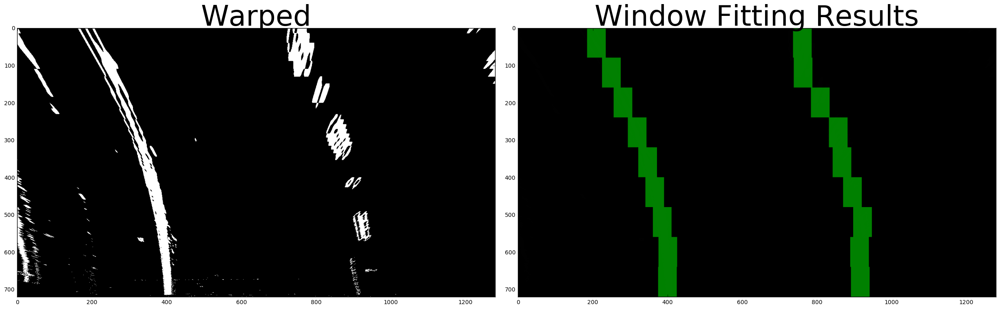

In [23]:
# Read in a thresholded image
warped = transformed_imgs[1]
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create window template to use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add to the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        
        # Add to next layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def draw_lines(img):
    window_centroids = find_window_centroids(img, window_width, window_height, margin)

    # If window centers were found
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(img)
        r_points = np.zeros_like(img)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width, window_height, img, window_centroids[level][0], level)
            r_mask = window_mask(window_width, window_height, img, window_centroids[level][1], level)
            
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channle 
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((img,img,img)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((img,img,img)),np.uint8)

    return output

# Display the final results
plot_imgs((warped, draw_lines(warped)), ('Warped', 'Window Fitting Results'), save=True)

### Now I need to calculate the radius of the curve

In [24]:
def measure_curve_pixels(ploty, left_fitx, right_fitx):
    # Define y-value for radius of curvature
    # Use maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_fit = np.polyfit(ploty, left_fitx, 2)
    right_fit = np.polyfit(ploty, right_fitx, 2)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    return(left_curverad, right_curverad)

print(measure_curve_pixels(ploty, left_fitx, right_fitx))

(1272.7016196151401, 1437.3032210815859)


This calculation is in pixels, so next I'll convert to meters

In [25]:
def measure_curve(ploty, leftx, rightx):
    # Define y-value for radius of curvature
    # Use maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 27/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/550 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now radius of curvature is in meters
    return(left_curverad, right_curverad)
    
print(measure_curve(ploty, left_fitx, right_fitx))

(265.87960549649887, 299.86586682702597)


### Finally, it's time to fill in the lane with color and convert back to the original perspective

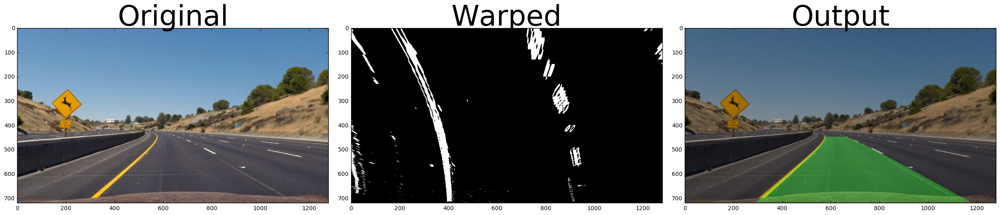

In [27]:
def draw_on_road(undist, warped, ploty, left_fitx, right_fitx):
    # Create an image to draw lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_(pts), (0, 255, 0))
    
    # Warp the blank back into original image space using inverse perspective matrix
    new_warp = warp(color_warp, src, dst, reverse=True)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 0.7, new_warp, 0.3, 0)
    return result

undist_img = undistorted_imgs[3]
warped_img = transformed_imgs[1]

new_img = draw_on_road(undist_img, warped_img, ploty, left_fitx, right_fitx)
plot_imgs((undist_img, warped_img, new_img), ('Original', 'Warped', 'Output'), save=True)

## Pipelines
### First I'll create a pipeline that does a blind search for the lane lines with each frame

In [30]:
def pipeline1(img):
    # Undistort images
    undist = calc_undistort(img, mtx, dist)
    
    # Define source and destination points
    src = np.float32([[600, 448], [686, 448], [1120, 720], [202, 720]])
    dst = np.float32([[350, 0], [900, 0], [900, 720], [350, 720]])

    # Warp images
    warped = warp(undist, src, dst)

    # Create binary warped images
    binary_warped = threshold_pipeline(warped)

    # Find lines
    out_img, ploty, left_fitx, right_fitx, left_fit, right_fit = find_lane_lines(binary_warped)

    # Measure the curve of the road
    curve = measure_curve(ploty, left_fitx, right_fitx)

    # Fill in lane green and undistort
    new_img = draw_on_road(img, binary_warped, ploty, left_fitx, right_fitx).astype(np.uint8)

    return new_img

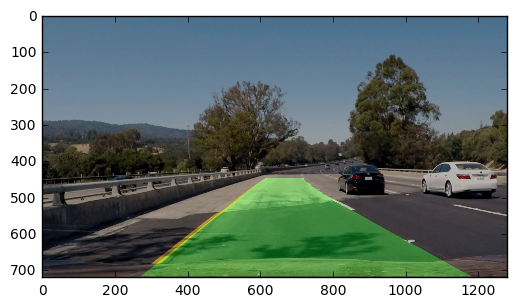

In [31]:
new_imgs = []
for img in original_imgs:
    new_image = pipeline1(img)
    new_imgs.append(new_image)

plt.imshow(new_imgs[5])   

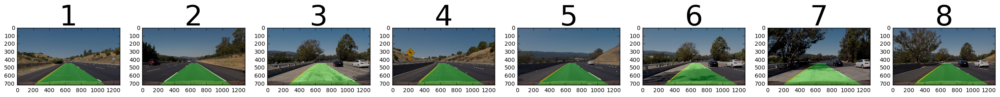

In [32]:
plot_imgs(new_imgs, ('1', '2', '3', '4', '5', '6', '7', '8', 'final_test_imgs'), save=True)  

This pipeline does very well on the test images. That makes sense, since the images are in no particular order, therefore we don't expect consecutive frames to have a similar curvature.

In [33]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [34]:
output = 'project_result.mp4'
clip1 = VideoFileClip('project_video.mp4')
clip = clip1.fl_image(pipeline1)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_result.mp4
[MoviePy] Writing video project_result.mp4


100%|█████████▉| 1260/1261 [02:33<00:00,  8.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_result.mp4 

CPU times: user 3min 20s, sys: 39.8 s, total: 4min
Wall time: 2min 34s


In [35]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

I can see that it doesn't work so well on the video where the lines are difficult to see in some places. In these cases, it would be helpful to do a targeted search for the lane based on the location of the lines in the last few frames. That way, if the lines are lost/hard to find, we can go with the average from the last few frames and try again in the next frame. To accomplish this, I'll create a Line class that stores information about the lines from the last few frames.

In [36]:
class Line():
    def __init__(self):
        # Was the line detected in the last iteration?
        self.detected = False

        # Number of iterations to smooth over
        self.n = 3

        # Most recent coefficients
        self.current = [0, 0, 0]

        # Difference in coefficients between last and new fit
        self.diffs = [0, 0, 0]

        # Polynomial coefficients with length n
        self.A = []
        self.B = []
        self.C = []

        # Average coefficients from last n iterations
        self.avg_A = 0
        self.avg_B = 0
        self.avg_C = 0

        # Radius of curvature
        self.rad_of_curve = None

    def add_avg_n_coefficients(self, A, B, C, radius):
        # Most recent coefficients
        self.current = [A, B, C]

        # Difference in coefficients between last n and new
        self.diffs = [A - self.avg_A, B - self.avg_B, C - self.avg_C]

        # Add new coeffiecients to array
        self.A.append(A)
        self.B.append(B)
        self.C.append(C)

        # Remove oldest coefficient if number of stored coefficients is greater than n
        if len(self.A) > self.n:
            self.A.pop(0)
            self.B.pop(0)
            self.C.pop(0)

        # Update average of coefficients
        self.avg_A = np.mean(self.A)
        self.avg_B = np.mean(self.B)
        self.avg_C = np.mean(self.C)

        # Radius of curvature
        self.rad_of_curve = radius
        return(self.avg_A, self.avg_B, self.avg_C)

    def get_coefficients(self):
        return(self.avg_A, self.avg_B, self.avg_C, self.diffs, self.rad_of_curve)

### Here is the final pipeline

In [49]:
left_line = Line()
right_line = Line()
    
def pipeline(img):
    # Undistort images
    undist = calc_undistort(img, mtx, dist)
    
    # Define source and destination points
    src = np.float32([[600, 448], [686, 448], [1120, 720], [202, 720]])
    dst = np.float32([[350, 0], [900, 0], [900, 720], [350, 720]])

    # Warp images
    warped = warp(undist, src, dst)

    # Create binary warped images
    binary_warped = threshold_pipeline(warped)
    
    # If a line was not detected:
    if left_line.detected == False:
        # Find lines blindly
        out_img, ploty, left_fitx, right_fitx, left_fit, right_fit = find_lane_lines(binary_warped)
        
        # Measure the radius of the curve of the road
        radius = measure_curve(ploty, left_fitx, right_fitx)
        radius_left = radius[0]
        radius_right = radius[1]
        
        # Add coefficients and radii to lines
        left_coeff = left_line.add_avg_n_coefficients(left_fit[0], left_fit[1], left_fit[2], radius_left)
        right_coeff = right_line.add_avg_n_coefficients(right_fit[0], right_fit[1], right_fit[2], radius_right)
        
        left_line.detected = True
    
    else:
        # Get last coefficients
        a_left, b_left, c_left, diffs_left, radius_left = left_line.get_coefficients()
        a_right, b_right, c_right, diffs_right, radius_right = right_line.get_coefficients()
        left_coeff = [a_left, b_left, c_left]
        right_coeff = [a_right, b_right, c_right]
        
        # Try to find lines within margin of last detected line
        margin = 100
        out_image, window_img, ploty, left_fitx, right_fitx, left_fit, right_fit = find_more_lane_lines(binary_warped, left_coeff, right_coeff)
        
        # Calculate radius of each line
        radius = measure_curve(ploty, left_fitx, right_fitx)
        radius_left = radius[0]
        radius_right = radius[1]
        
        # If a line was detected within the margin and radii are reasonably close to parallel:
        if (left_fit != None) and ((radius_right < radius_left + 50) and (radius_right > radius_left - 50)):
            # Add coefficients and radii to lines
            left_coeff = left_line.add_avg_n_coefficients(left_fit[0], left_fit[1], left_fit[2], radius_left)
            right_coeff = right_line.add_avg_n_coefficients(right_fit[0], right_fit[1], right_fit[2], radius_right)
            left_fitx = left_coeff[0]*ploty**2 + left_coeff[1]*ploty + left_coeff[2]
            right_fitx = right_coeff[0]*ploty**2 + right_coeff[1]*ploty + right_coeff[2]
        else:
            # Use average coefficients from last n frames to plot lines
            left_fitx = left_line.avg_A*ploty**2 + left_line.avg_B*ploty + left_line.avg_C
            right_fitx = right_line.avg_A*ploty**2 + right_line.avg_B*ploty + right_line.avg_C
            left_line.detected = False
            
    # Fill in lane green and undistort
    new_img = draw_on_road(img, binary_warped, ploty, left_fitx, right_fitx).astype(np.uint8)
    
    # Write curve on image
    new_img = cv2.putText(new_img, 
                "Left: {0} Right: {1}".format(str(radius_left), str(radius_right)), 
                (5,50), cv2.FONT_HERSHEY_SIMPLEX, 1, 255)

    return new_img

In [50]:
final_output = 'final_project_result.mp4'
clip2 = VideoFileClip('project_video.mp4')
clip = clip2.fl_image(pipeline)
%time clip.write_videofile(final_output, audio=False)

[MoviePy] >>>> Building video final_project_result.mp4
[MoviePy] Writing video final_project_result.mp4


100%|█████████▉| 1260/1261 [02:37<00:00,  8.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: final_project_result.mp4 

CPU times: user 3min 21s, sys: 43.4 s, total: 4min 5s
Wall time: 2min 38s


In [51]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(final_output))

### Conclusions:
It's a little wobbly in some places, but the lanes are drawn where they are expected! Just for fun, let's see how the pipeline does on the challenge videos.

In [52]:
challenge1 = 'challenge_video_result.mp4'
clip3 = VideoFileClip('./challenge_videos/challenge_video.mp4')
clip = clip3.fl_image(pipeline)
%time clip.write_videofile(challenge1, audio=False)

[MoviePy] >>>> Building video challenge_video_result.mp4
[MoviePy] Writing video challenge_video_result.mp4


100%|██████████| 485/485 [00:56<00:00,  8.50it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_result.mp4 

CPU times: user 1min 15s, sys: 13.8 s, total: 1min 29s
Wall time: 57.1 s


In [53]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge1))

In [54]:
challenge2 = 'harder_challenge_result.mp4'
clip4 = VideoFileClip('./challenge_videos/harder_challenge_video.mp4')
clip = clip4.fl_image(pipeline)
%time clip.write_videofile(challenge2, audio=False)

[MoviePy] >>>> Building video harder_challenge_result.mp4
[MoviePy] Writing video harder_challenge_result.mp4


100%|█████████▉| 1199/1200 [02:35<00:00,  7.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_result.mp4 

CPU times: user 3min 18s, sys: 40.1 s, total: 3min 59s
Wall time: 2min 36s


In [55]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge2))